# 🇧🇩  🔢 Bengali Number Plate Detection 🚗 🔍

📦 Importing Required Libraries

In [ ]:
import os
import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from ultralytics import YOLO
import cv2
import numpy as np
import random
import json

FlashAttention is not available on this device. Using scaled_dot_product_attention instead.


⚙️ Configuration and Hyperparameters

In [2]:
EPOCHS = 500
IMG_SIZE = 640
BATCH_SIZE = 32
CONF_THRESHOLD = 0.25
IOU_THRESHOLD = 0.45

Project_Name = 'num_plate'
RUN_NAME = 'YOLO12_'

TRAIN_PROJECT_NAME = Project_Name
TRAIN_RUN_NAME = 'train_'+RUN_NAME

PREDICT_PROJECT_NAME = Project_Name
PREDICT_RUN_NAME = 'prediction_'+RUN_NAME

num_images_to_predict = 10

DATASET_PATH = 'dataset'
# DATASET_PATH = ''
YAML_FILE = DATASET_PATH + '/data.yaml'

## 🏋️ Training

🤖 Defining Model 📦

In [3]:
model = YOLO("yolov12n.pt", task='detect')

🧑‍🏫 Train the Model 🏃‍♂️

In [4]:
results = model.train(
    data=YAML_FILE,
    epochs=EPOCHS,
    imgsz=IMG_SIZE,
    batch=BATCH_SIZE,
    project=TRAIN_PROJECT_NAME,
    name=TRAIN_RUN_NAME,
    amp=True,
    patience=50,
    pretrained=True,
    optimizer='auto'
)

print("Training finished. Model saved to:", model.trainer.save_dir)

BEST_MODEL_PATH = os.path.join(model.trainer.save_dir, 'weights', 'best.pt')
print("Best model weights path:", BEST_MODEL_PATH)

New https://pypi.org/project/ultralytics/8.3.168 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.13 torch-2.2.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3060, 11913MiB)
engine/trainer: task=detect, mode=train, model=yolov12n.pt, data=dataset/data.yaml, epochs=500, time=None, patience=50, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=num_plate, name=train_YOLO12_12, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, s

train: Scanning /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/train/labels.cache... 1865 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1865/1865 [00:00<?, ?it/s]

train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/train/images/159.jpeg: 1 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/train/images/197.jpeg: 1 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/train/images/289.jpg: 1 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/train/images/315.jpg: 2 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/train/images/320.jpg: 1 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/train/images/325.jpg: 1 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/train/images/327.jpg: 1 duplicate labels removed
train: /mnt/Common/Code/Model Training/Nowshin

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/.conda/lib/python3.11/site-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.8' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
/mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/yolov12/ultralytics/data/augment.py:1853: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
val: Scanning /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/val/labels.cache... 533 images, 0 backgrounds, 0 corrupt: 100%|██████████| 533/533 [00:00<?, ?it/s]

val: /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/val/images/49.jpeg: 1 duplicate labels removed


Plotting labels to num_plate/train_YOLO12_12/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 121 weight(decay=0.0), 128 weight(decay=0.0005), 127 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to num_plate/train_YOLO12_12
Starting training for 500 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/500      7.74G      1.758      5.257      1.532        468        640:  56%|█████▌    | 33/59 [00:16<00:12,  2.07it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      1/500      7.83G      1.581      4.759      1.374        139        640: 100%|██████████| 59/59 [00:28<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.30it/s]

                   all        533       4442     0.0223     0.0275     0.0207     0.0139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/500      7.78G      1.392      3.216      1.216        512        640:   7%|▋         | 4/59 [00:01<00:25,  2.15it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      2/500      7.87G      1.397      2.446       1.27        125        640: 100%|██████████| 59/59 [00:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.51it/s]

                   all        533       4442      0.764     0.0963      0.115     0.0678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/500      7.78G      1.396      1.944      1.294        449        640:   7%|▋         | 4/59 [00:01<00:25,  2.16it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      3/500      7.84G      1.392      1.732      1.279         86        640: 100%|██████████| 59/59 [00:26<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.58it/s]


                   all        533       4442      0.802      0.168      0.178      0.107

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/500       7.8G      1.399      1.437       1.29        547        640:  97%|█████████▋| 57/59 [00:25<00:00,  2.23it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      4/500      7.88G      1.399       1.43       1.29        139        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.48it/s]


                   all        533       4442      0.618      0.194      0.197      0.113

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/500      7.88G      1.377      1.275      1.285        126        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.54it/s]


                   all        533       4442      0.429      0.325      0.278      0.179

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/500       7.8G      1.379      1.202      1.284        482        640:  49%|████▉     | 29/59 [00:13<00:13,  2.23it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      6/500      7.88G      1.366      1.199       1.28        106        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]

                   all        533       4442       0.59      0.336      0.325      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/500      7.81G      1.348       1.13      1.274        509        640:  68%|██████▊   | 40/59 [00:18<00:08,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      7/500      7.88G      1.347      1.125      1.274        148        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.47it/s]

                   all        533       4442      0.435      0.436      0.384      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/500      7.81G      1.357      1.145      1.314        401        640:   3%|▎         | 2/59 [00:00<00:26,  2.19it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      8/500      7.89G      1.341      1.062      1.269        116        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]


                   all        533       4442      0.514      0.525      0.473      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/500       7.8G      1.319      1.027      1.259        475        640:  95%|█████████▍| 56/59 [00:25<00:01,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
      9/500      7.87G      1.321       1.03       1.26        143        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]

                   all        533       4442      0.482       0.55      0.512      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/500      7.87G      1.318     0.9908       1.26        125        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.55it/s]

                   all        533       4442      0.595      0.499      0.576      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/500      7.87G      1.323     0.9604       1.27        127        640: 100%|██████████| 59/59 [00:26<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        533       4442      0.606       0.69      0.683      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/500      7.78G      1.308     0.9517      1.255        497        640:  44%|████▍     | 26/59 [00:11<00:14,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     12/500      7.86G      1.306     0.9431      1.257        144        640: 100%|██████████| 59/59 [00:26<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]

                   all        533       4442      0.685      0.607      0.708       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/500      7.79G       1.31     0.9302      1.268        475        640:  44%|████▍     | 26/59 [00:11<00:14,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     13/500      7.79G      1.304     0.9211      1.261        482        640:  97%|█████████▋| 57/59 [00:25<00:00,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     13/500      7.86G      1.304     0.9207       1.26        148        640: 100%|██████████| 59/59 [00:26<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        533       4442      0.724      0.672      0.738      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/500      7.85G      1.301     0.8863       1.25        139        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]

                   all        533       4442      0.731      0.686      0.793      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/500      7.78G      1.289     0.8915      1.253        531        640:  66%|██████▌   | 39/59 [00:17<00:09,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     15/500      7.85G      1.295     0.8915      1.257        129        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]

                   all        533       4442       0.63      0.654      0.721        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/500      7.85G      1.286     0.8615       1.24        145        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        533       4442      0.738      0.706      0.794       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/500       7.8G      1.288     0.8377      1.232        550        640:  22%|██▏       | 13/59 [00:05<00:20,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     17/500      7.87G      1.286     0.8426      1.248        136        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.58it/s]

                   all        533       4442      0.739      0.803      0.863      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/59 [00:00<?, ?it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     18/500      7.82G       1.29     0.8353      1.251        168        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        533       4442      0.711      0.804      0.859      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/500      7.78G      1.278     0.8305      1.252        418        640:  32%|███▏      | 19/59 [00:08<00:18,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     19/500      7.78G      1.281     0.8236      1.248        449        640:  75%|███████▍  | 44/59 [00:19<00:06,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     19/500      7.85G      1.278     0.8216      1.243        178        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.58it/s]

                   all        533       4442       0.75      0.822      0.866      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/500      7.83G      1.277     0.8064       1.24        140        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.773      0.811       0.88      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/500      7.81G      1.248     0.7921       1.22        491        640:   5%|▌         | 3/59 [00:01<00:25,  2.19it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     21/500      7.88G      1.274     0.7956      1.239        113        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.65it/s]

                   all        533       4442      0.788      0.827      0.894      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/500      7.74G      1.261     0.7938       1.23        519        640:  51%|█████     | 30/59 [00:13<00:13,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     22/500      7.82G      1.262      0.783      1.235        118        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        533       4442       0.86      0.818      0.907      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/500      7.75G      1.267     0.7802      1.238        501        640:  69%|██████▉   | 41/59 [00:18<00:08,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     23/500      7.82G      1.265     0.7762       1.24        110        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.65it/s]

                   all        533       4442      0.786       0.77      0.852      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/500      7.78G       1.25     0.7658      1.227        527        640:  32%|███▏      | 19/59 [00:08<00:18,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     24/500      7.86G      1.253     0.7647      1.226        135        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        533       4442      0.816      0.864      0.911      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/500      7.87G      1.252     0.7531       1.24         80        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.60it/s]

                   all        533       4442      0.832      0.853      0.918      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/500      7.75G      1.256      0.747      1.221        525        640:  68%|██████▊   | 40/59 [00:18<00:08,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     26/500      7.83G      1.252     0.7441      1.224        150        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.883      0.862      0.926      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/500      7.81G       1.24     0.7386      1.217        521        640:  15%|█▌        | 9/59 [00:04<00:22,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     27/500      7.88G      1.252      0.746      1.231        167        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.65it/s]

                   all        533       4442      0.847      0.867      0.924      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/500      7.74G      1.248     0.7351      1.231        478        640:  64%|██████▍   | 38/59 [00:17<00:09,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     28/500      7.83G      1.246     0.7312       1.23         91        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.58it/s]

                   all        533       4442      0.901      0.875      0.929      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/500      7.76G      1.239     0.7229      1.224        496        640:  42%|████▏     | 25/59 [00:11<00:15,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     29/500      7.76G      1.244     0.7228      1.229        538        640:  73%|███████▎  | 43/59 [00:19<00:07,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     29/500      7.83G      1.246     0.7193      1.232        116        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        533       4442      0.883      0.861      0.926      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/500      7.79G      1.245     0.7248      1.226        481        640:  95%|█████████▍| 56/59 [00:25<00:01,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     30/500      7.87G      1.243     0.7233      1.223        117        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        533       4442      0.884       0.86      0.931      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/500      7.88G       1.23     0.7091      1.218        150        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        533       4442      0.881      0.837      0.912      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/500      7.79G      1.235     0.6991      1.222        458        640:  64%|██████▍   | 38/59 [00:17<00:09,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     32/500      7.87G      1.237     0.7015      1.227        104        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        533       4442      0.887       0.86      0.932      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/500      7.81G      1.225     0.6958      1.221        608        640:  58%|█████▊    | 34/59 [00:15<00:11,  2.23it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     33/500      7.88G      1.225     0.6933      1.217        117        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        533       4442      0.885      0.877      0.937      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/500      7.78G      1.224     0.6928      1.221        601        640:  22%|██▏       | 13/59 [00:05<00:20,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     34/500      7.86G      1.219     0.6862      1.219        105        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        533       4442      0.916      0.869      0.939      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/500      7.81G      1.222     0.6823      1.217        470        640:  56%|█████▌    | 33/59 [00:14<00:11,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     35/500      7.88G       1.22     0.6796      1.217        117        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        533       4442      0.908      0.881      0.945      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/500      7.87G       1.22     0.6778       1.21        126        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]

                   all        533       4442      0.909      0.859      0.931      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/500       7.8G       1.21     0.6678      1.219        486        640:  41%|████      | 24/59 [00:10<00:15,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     37/500      7.87G      1.221     0.6706      1.226        139        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        533       4442      0.912      0.872      0.944      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/500      7.77G      1.218     0.6727      1.208        432        640:  44%|████▍     | 26/59 [00:11<00:13,  2.43it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     38/500      7.85G      1.217     0.6698      1.212        153        640: 100%|██████████| 59/59 [00:24<00:00,  2.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.94it/s]

                   all        533       4442      0.916      0.881       0.94      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/500      7.82G      1.202     0.6541      1.201        550        640:  54%|█████▍    | 32/59 [00:13<00:11,  2.45it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     39/500      7.82G      1.205     0.6573      1.204        466        640:  92%|█████████▏| 54/59 [00:22<00:02,  2.45it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     39/500      7.89G      1.204     0.6559      1.205        120        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.96it/s]

                   all        533       4442      0.914      0.894      0.944      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/500      7.85G      1.206     0.6598       1.21        151        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.99it/s]

                   all        533       4442      0.914      0.888      0.945      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/500       7.8G      1.206     0.6635      1.211        543        640:  46%|████▌     | 27/59 [00:11<00:13,  2.44it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     41/500      7.87G      1.207     0.6548      1.214        141        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.86it/s]

                   all        533       4442      0.907      0.905      0.949      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/500      7.78G      1.229     0.6591      1.205        501        640:   2%|▏         | 1/59 [00:00<00:24,  2.41it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     42/500      7.87G      1.202     0.6492      1.205        125        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.99it/s]

                   all        533       4442      0.924      0.875      0.944      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/500      7.76G      1.165     0.6431      1.179        489        640:   5%|▌         | 3/59 [00:01<00:23,  2.40it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     43/500      7.83G      1.192     0.6378      1.199        128        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.92it/s]

                   all        533       4442       0.93      0.906      0.953      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/500      7.76G      1.191     0.6353      1.192        487        640:  37%|███▋      | 22/59 [00:09<00:15,  2.43it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     44/500      7.84G      1.203     0.6375      1.202        128        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.91it/s]

                   all        533       4442      0.921      0.898      0.954      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/500      7.79G      1.208     0.6538      1.211        475        640:  31%|███       | 18/59 [00:07<00:16,  2.44it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     45/500      7.86G      1.202      0.641      1.207        193        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.92it/s]

                   all        533       4442      0.913       0.89      0.953      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/500      7.77G       1.19     0.6256      1.202        486        640:  47%|████▋     | 28/59 [00:11<00:12,  2.44it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     46/500      7.85G      1.193     0.6277      1.199        141        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.88it/s]

                   all        533       4442      0.921      0.885      0.946       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/500      7.88G      1.195     0.6235      1.201        181        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.98it/s]

                   all        533       4442      0.918      0.891      0.951      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/500      7.75G      1.177     0.6205      1.205        446        640:  44%|████▍     | 26/59 [00:10<00:13,  2.43it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     48/500      7.83G      1.185     0.6206      1.202        161        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.97it/s]

                   all        533       4442      0.926      0.881      0.955       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/500      7.78G      1.235     0.6245      1.234        556        640:   3%|▎         | 2/59 [00:00<00:24,  2.37it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     49/500      7.78G      1.189     0.6192      1.195        526        640:  75%|███████▍  | 44/59 [00:18<00:06,  2.46it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     49/500      7.85G       1.19     0.6198      1.196        187        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.97it/s]

                   all        533       4442      0.917      0.899       0.95      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/500      7.87G      1.183     0.6148        1.2        118        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.00it/s]

                   all        533       4442      0.918      0.914      0.952      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/500       7.8G      1.178     0.6102      1.185        495        640:  51%|█████     | 30/59 [00:12<00:11,  2.45it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     51/500      7.86G      1.174     0.6048       1.19        114        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.85it/s]

                   all        533       4442      0.939      0.907      0.957      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/500      7.76G      1.173     0.6109       1.19        568        640:  64%|██████▍   | 38/59 [00:15<00:08,  2.44it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     52/500      7.76G      1.169     0.6096      1.189        551        640:  80%|███████▉  | 47/59 [00:19<00:04,  2.45it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     52/500      7.84G      1.171     0.6082      1.189        149        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.98it/s]

                   all        533       4442       0.93      0.907      0.956      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/500      7.89G      1.162     0.6005      1.188        100        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.93it/s]

                   all        533       4442      0.915      0.902      0.951      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/500      7.79G      1.156     0.5912       1.19        520        640:  34%|███▍      | 20/59 [00:08<00:16,  2.44it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     54/500      7.87G       1.16      0.592      1.187        171        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.99it/s]

                   all        533       4442      0.918      0.924      0.956       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/500       7.8G      1.168     0.5997      1.194        497        640:  25%|██▌       | 15/59 [00:06<00:18,  2.44it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     55/500       7.8G      1.164     0.5894      1.188        541        640:  95%|█████████▍| 56/59 [00:22<00:01,  2.45it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     55/500      7.87G      1.165     0.5885      1.189        147        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.96it/s]

                   all        533       4442      0.943      0.904       0.96      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/500      7.83G      1.156     0.5914      1.186        140        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.99it/s]

                   all        533       4442       0.94       0.89      0.953      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/500       7.8G      1.169     0.5997      1.187        523        640:  41%|████      | 24/59 [00:09<00:14,  2.45it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     57/500      7.86G      1.161     0.5892      1.185        132        640: 100%|██████████| 59/59 [00:23<00:00,  2.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.97it/s]

                   all        533       4442      0.924      0.921      0.957      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/500      7.79G      1.168     0.5893      1.188        519        640:  27%|██▋       | 16/59 [00:06<00:17,  2.43it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     58/500      7.87G      1.162     0.5887      1.188        119        640: 100%|██████████| 59/59 [00:24<00:00,  2.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        533       4442       0.94      0.912      0.951      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/500      7.82G      1.163     0.5822      1.168        496        640:  10%|█         | 6/59 [00:02<00:24,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     59/500      7.89G      1.152     0.5806      1.184        155        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.56it/s]

                   all        533       4442      0.926      0.894       0.96      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/500      7.78G      1.151     0.5863      1.188        536        640:  69%|██████▉   | 41/59 [00:18<00:08,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     60/500      7.78G      1.151     0.5844      1.184        453        640:  78%|███████▊  | 46/59 [00:20<00:05,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     60/500      7.86G      1.151     0.5834      1.182        160        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442       0.93      0.904       0.96      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/500      7.78G      1.154     0.5746      1.181        492        640:  95%|█████████▍| 56/59 [00:25<00:01,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     61/500      7.84G      1.154     0.5745       1.18        111        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        533       4442      0.944      0.922      0.961      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/500      7.87G      1.147      0.576      1.182        146        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.947      0.916      0.962       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/500      7.78G      1.146     0.5684      1.178        450        640:  24%|██▎       | 14/59 [00:06<00:20,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     63/500      7.78G      1.144     0.5699       1.18        456        640:  86%|████████▋ | 51/59 [00:23<00:03,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     63/500      7.84G      1.145     0.5704      1.179        165        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.61it/s]

                   all        533       4442      0.937      0.904      0.955      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/500      7.83G      1.139     0.5679      1.176        106        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.72it/s]

                   all        533       4442      0.937      0.922      0.959      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/500       7.8G      1.144     0.5676      1.195        446        640:  22%|██▏       | 13/59 [00:05<00:20,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     65/500       7.8G      1.141     0.5624      1.183        513        640:  75%|███████▍  | 44/59 [00:19<00:06,  2.23it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     65/500      7.86G      1.139     0.5634      1.181        150        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.936      0.931      0.963      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/500      7.83G      1.137     0.5596      1.176        104        640: 100%|██████████| 59/59 [00:26<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        533       4442      0.941      0.904       0.96      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/500      7.77G      1.142     0.5824       1.19        450        640:   8%|▊         | 5/59 [00:02<00:24,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     67/500      7.83G      1.134     0.5636      1.178        134        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.56it/s]

                   all        533       4442      0.927      0.901      0.949      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/500      7.75G      1.128     0.5635      1.176        548        640:  34%|███▍      | 20/59 [00:09<00:17,  2.19it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     68/500      7.83G      1.128     0.5602      1.178        104        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        533       4442      0.944      0.931      0.962      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/500      7.83G      1.132     0.5573      1.171        502        640:  31%|███       | 18/59 [00:08<00:18,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     69/500      7.83G      1.132     0.5575      1.171        455        640:  78%|███████▊  | 46/59 [00:20<00:05,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     69/500      7.89G       1.13     0.5543      1.172        162        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        533       4442      0.938      0.903      0.954      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/500      7.84G      1.125     0.5549      1.166        139        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        533       4442       0.94      0.922      0.958      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/500      7.79G      1.124     0.5505      1.173        453        640:  42%|████▏     | 25/59 [00:11<00:15,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     71/500      7.86G      1.117     0.5475      1.164        177        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.62it/s]

                   all        533       4442      0.944      0.896      0.953      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/500      7.77G      1.134     0.5527      1.185        410        640:  20%|██        | 12/59 [00:05<00:21,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     72/500      7.85G      1.112     0.5441      1.171         98        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.932      0.923      0.955      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/500      7.75G      1.125     0.5593      1.164        500        640:  14%|█▎        | 8/59 [00:03<00:23,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     73/500      7.75G      1.118     0.5525      1.166        532        640:  88%|████████▊ | 52/59 [00:23<00:03,  2.23it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     73/500      7.82G      1.118     0.5523      1.166        143        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        533       4442      0.938      0.912      0.956      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/500      7.83G       1.11     0.5381      1.166        119        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        533       4442      0.954      0.917      0.955      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/500      7.82G      1.112     0.5453      1.168        432        640:  31%|███       | 18/59 [00:08<00:18,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     75/500      7.82G      1.114     0.5425      1.162        502        640:  80%|███████▉  | 47/59 [00:21<00:05,  2.15it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     75/500      7.89G      1.112     0.5404      1.161        135        640: 100%|██████████| 59/59 [00:26<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.55it/s]

                   all        533       4442      0.936      0.896      0.953      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/500      7.78G      1.106     0.5379      1.162        508        640:  88%|████████▊ | 52/59 [00:24<00:03,  2.08it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     76/500      7.86G      1.106     0.5421      1.162        107        640: 100%|██████████| 59/59 [00:27<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.49it/s]

                   all        533       4442      0.953      0.915       0.96      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/500      7.86G       1.11     0.5405      1.167        107        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        533       4442      0.954      0.913      0.962      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/500      7.83G      1.104     0.5383      1.161        175        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        533       4442      0.941      0.922      0.969      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/500       7.8G      1.107     0.5346      1.164        506        640:  41%|████      | 24/59 [00:10<00:16,  2.19it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     79/500      7.86G      1.103     0.5336      1.163        171        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]

                   all        533       4442      0.948      0.926      0.957      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/500      7.75G      1.111     0.5426      1.171        478        640:   7%|▋         | 4/59 [00:01<00:25,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     80/500      7.75G      1.095     0.5325       1.16        492        640:  80%|███████▉  | 47/59 [00:21<00:05,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     80/500      7.83G      1.098     0.5327      1.159        138        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        533       4442      0.954      0.906       0.96       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/500      7.78G      1.092     0.5298      1.154        508        640:  95%|█████████▍| 56/59 [00:25<00:01,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     81/500      7.84G      1.093     0.5323      1.155        135        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        533       4442      0.937      0.909      0.957      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/500      7.83G       1.09     0.5368       1.16         95        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        533       4442      0.937      0.911      0.957      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/500      7.82G      1.092     0.5319      1.155        469        640:  58%|█████▊    | 34/59 [00:15<00:11,  2.23it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     83/500      7.89G       1.09     0.5306      1.154        163        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        533       4442      0.948      0.906      0.959      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/500      7.87G      1.082     0.5271      1.154        132        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.65it/s]

                   all        533       4442      0.943      0.909      0.961      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/500       7.8G      1.092     0.5358      1.155        474        640:  20%|██        | 12/59 [00:05<00:21,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     85/500      7.87G      1.086     0.5291      1.157        103        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        533       4442       0.92      0.912      0.953      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/500      7.78G      1.076     0.5189      1.151        496        640:  54%|█████▍    | 32/59 [00:14<00:12,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     86/500      7.86G      1.078     0.5139      1.153        141        640: 100%|██████████| 59/59 [00:26<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        533       4442      0.952      0.915      0.962      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/500      7.74G      1.097     0.5268      1.158        438        640:   5%|▌         | 3/59 [00:01<00:25,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     87/500      7.81G      1.077     0.5196      1.157        152        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        533       4442      0.941      0.907      0.955      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/500      7.79G      1.078     0.5192      1.149        453        640:  44%|████▍     | 26/59 [00:11<00:14,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     88/500      7.79G      1.073     0.5168      1.143        464        640:  80%|███████▉  | 47/59 [00:21<00:05,  2.23it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     88/500      7.87G      1.076      0.518      1.145        150        640: 100%|██████████| 59/59 [00:26<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.72it/s]

                   all        533       4442      0.946      0.921      0.966      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/500      7.87G      1.072      0.512      1.151        151        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.64it/s]

                   all        533       4442      0.946      0.918      0.958       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/500      7.79G      1.077     0.5176      1.154        402        640:  14%|█▎        | 8/59 [00:03<00:23,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     90/500      7.87G      1.066     0.5151      1.146        152        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        533       4442      0.924      0.921      0.956       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/500       7.8G      1.046     0.5042      1.136        488        640:  15%|█▌        | 9/59 [00:04<00:22,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     91/500      7.87G      1.063     0.5095      1.138        129        640: 100%|██████████| 59/59 [00:26<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        533       4442      0.947      0.922       0.96      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/500      7.87G      1.059     0.5068      1.135        130        640: 100%|██████████| 59/59 [00:26<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.73it/s]

                   all        533       4442      0.953      0.918       0.96      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/500      7.82G      1.056      0.511      1.144        530        640:  37%|███▋      | 22/59 [00:09<00:16,  2.23it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     93/500      7.82G      1.057     0.5076      1.142        463        640:  80%|███████▉  | 47/59 [00:21<00:05,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     93/500      7.89G      1.059     0.5072      1.142        137        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        533       4442       0.95      0.925      0.962      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/500      7.87G      1.053     0.5045      1.135        207        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        533       4442      0.943      0.912      0.958      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/500      7.76G      1.049      0.508      1.132        496        640:  12%|█▏        | 7/59 [00:03<00:23,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     95/500      7.83G      1.053     0.5095      1.145        186        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.947      0.925       0.96      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/500      7.79G      1.047     0.4963      1.136        435        640:  46%|████▌     | 27/59 [00:12<00:14,  2.23it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     96/500      7.87G      1.054     0.5055      1.136        144        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.63it/s]

                   all        533       4442      0.951      0.918      0.959      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/500      7.79G      1.044     0.5016      1.133        538        640:  51%|█████     | 30/59 [00:13<00:13,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     97/500      7.79G      1.041      0.496      1.129        446        640:  81%|████████▏ | 48/59 [00:21<00:04,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     97/500      7.86G      1.041     0.4963      1.128        136        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        533       4442      0.946       0.92      0.958      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/500      7.86G      1.047     0.5038      1.136         85        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        533       4442      0.942      0.917      0.958      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/500      7.81G      1.035     0.4904      1.135        454        640:  12%|█▏        | 7/59 [00:03<00:23,  2.18it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
     99/500      7.88G      1.037     0.4969      1.134        103        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        533       4442      0.948      0.916      0.959      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/500      7.87G      1.038     0.4967      1.135        121        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        533       4442      0.944      0.909      0.963      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/500      7.79G      1.037     0.5041       1.13        380        640:  15%|█▌        | 9/59 [00:04<00:22,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    101/500      7.86G      1.036     0.4971      1.133        143        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        533       4442      0.945      0.916      0.954      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/500      7.79G      1.039     0.4928      1.128        546        640:  69%|██████▉   | 41/59 [00:18<00:08,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    102/500      7.87G      1.032     0.4905      1.126        151        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.948      0.915      0.962      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/500      7.81G      1.032     0.4975      1.136        517        640:  12%|█▏        | 7/59 [00:03<00:23,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    103/500      7.81G      1.025     0.4905      1.119        548        640:  95%|█████████▍| 56/59 [00:25<00:01,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    103/500      7.88G      1.025       0.49      1.121         98        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        533       4442      0.957       0.92      0.961      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/500      7.85G      1.027     0.4888      1.119        155        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.68it/s]

                   all        533       4442      0.963      0.922      0.959      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/500      7.81G      1.018     0.4811      1.117        476        640:  14%|█▎        | 8/59 [00:03<00:22,  2.23it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    105/500      7.87G      1.021     0.4916      1.121        118        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        533       4442      0.951       0.92      0.959      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/500      7.78G      1.004     0.4827      1.118        514        640:  20%|██        | 12/59 [00:05<00:21,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    106/500      7.86G      1.016     0.4874      1.118        112        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        533       4442      0.946      0.919      0.959      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/500       7.8G      1.019      0.484      1.128        540        640:  39%|███▉      | 23/59 [00:10<00:16,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    107/500      7.87G      1.021     0.4856      1.122        125        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.954       0.92      0.961      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/500      7.74G       1.02     0.4835      1.119        579        640:  27%|██▋       | 16/59 [00:07<00:19,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    108/500      7.83G      1.015     0.4832      1.118        148        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.67it/s]

                   all        533       4442      0.948      0.906      0.949      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/500       7.8G      1.022     0.4927      1.121        488        640:  25%|██▌       | 15/59 [00:06<00:19,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    109/500      7.87G      1.012     0.4848      1.117        136        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        533       4442      0.955       0.91      0.961      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/500       7.8G      1.008     0.4823      1.116        468        640:  69%|██████▉   | 41/59 [00:18<00:08,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    110/500      7.88G      1.004     0.4809      1.114        118        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.955      0.908      0.964      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/500      7.81G      1.023     0.4829      1.104        534        640:  19%|█▊        | 11/59 [00:05<00:21,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    111/500      7.88G      1.002     0.4754      1.109        130        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        533       4442      0.958      0.906      0.954      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/500      7.87G      1.005     0.4805      1.113        105        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/9 [00:00<?, ?it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        533       4442      0.951      0.906      0.956      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/500      7.87G      1.001     0.4748      1.109        167        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        533       4442       0.96      0.904      0.958      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/500      7.78G     0.9982     0.4821      1.108        501        640:  47%|████▋     | 28/59 [00:12<00:14,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    114/500      7.86G     0.9999     0.4783      1.106        128        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.944       0.92      0.959      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/500      7.76G     0.9881      0.468      1.107        516        640:  22%|██▏       | 13/59 [00:05<00:20,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    115/500      7.76G     0.9902     0.4737      1.103        517        640:  93%|█████████▎| 55/59 [00:24<00:01,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    115/500      7.83G     0.9909     0.4741      1.103        145        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        533       4442      0.956      0.921      0.959      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/500      7.83G     0.9864     0.4708      1.102        126        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.71it/s]

                   all        533       4442      0.959      0.919      0.961       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/500      7.81G     0.9944     0.4731      1.106        437        640:  42%|████▏     | 25/59 [00:11<00:15,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    117/500      7.88G     0.9886     0.4715      1.106        128        640: 100%|██████████| 59/59 [00:26<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.945      0.915      0.961      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/500      7.77G      1.003     0.4769      1.107        476        640:  44%|████▍     | 26/59 [00:11<00:14,  2.21it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    118/500      7.85G     0.9962     0.4778      1.107        123        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.72it/s]

                   all        533       4442      0.951       0.91      0.957      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/500      7.78G     0.9791     0.4583      1.095        517        640:   8%|▊         | 5/59 [00:02<00:24,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    119/500      7.85G     0.9821     0.4696        1.1        160        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.69it/s]

                   all        533       4442      0.956      0.902      0.956      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/500      7.76G     0.9792     0.4712      1.105        493        640:  39%|███▉      | 23/59 [00:10<00:16,  2.23it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    120/500      7.84G     0.9812     0.4724      1.107        147        640: 100%|██████████| 59/59 [00:26<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.59it/s]

                   all        533       4442      0.956      0.922      0.957      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/500       7.8G     0.9778     0.4745      1.113        464        640:  56%|█████▌    | 33/59 [00:14<00:11,  2.20it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    121/500      7.87G     0.9756     0.4678      1.102        201        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.66it/s]

                   all        533       4442      0.956      0.914      0.961      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/500      7.75G     0.9757     0.4646      1.104        586        640:  49%|████▉     | 29/59 [00:13<00:13,  2.22it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    122/500      7.83G     0.9717      0.464      1.102        180        640: 100%|██████████| 59/59 [00:26<00:00,  2.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.70it/s]

                   all        533       4442      0.949      0.921      0.961      0.694



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/500      7.82G     0.9743      0.463      1.096        551        640:  49%|████▉     | 29/59 [00:13<00:14,  2.11it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    123/500      7.89G      0.968     0.4631      1.095        157        640: 100%|██████████| 59/59 [00:27<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.48it/s]

                   all        533       4442      0.954      0.908      0.958      0.682



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/500      7.75G     0.9751     0.4636      1.114        383        640:  15%|█▌        | 9/59 [00:04<00:23,  2.11it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    124/500      7.75G     0.9719     0.4654      1.108        463        640:  90%|████████▉ | 53/59 [00:25<00:02,  2.11it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    124/500      7.83G     0.9721     0.4661      1.108        189        640: 100%|██████████| 59/59 [00:27<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.50it/s]

                   all        533       4442      0.944      0.919       0.96      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/500      7.84G     0.9627     0.4645      1.093        155        640: 100%|██████████| 59/59 [00:27<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.49it/s]

                   all        533       4442      0.951      0.908      0.955      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/500      7.77G     0.9648     0.4562      1.092        477        640:  42%|████▏     | 25/59 [00:11<00:15,  2.16it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    126/500      7.85G     0.9654       0.46      1.095        139        640: 100%|██████████| 59/59 [00:27<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.57it/s]

                   all        533       4442      0.956      0.908      0.957      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/500      7.79G     0.9464     0.4548      1.081        540        640:  32%|███▏      | 19/59 [00:08<00:18,  2.14it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    127/500      7.79G     0.9543     0.4564      1.094        499        640:  98%|█████████▊| 58/59 [00:26<00:00,  2.16it/s]libpng warning: iCCP: profile 'ICC Profile': 0h: PCS illuminant is not D50
    127/500      7.85G     0.9545     0.4555      1.094        153        640: 100%|██████████| 59/59 [00:27<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.57it/s]

                   all        533       4442      0.956      0.915       0.96       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/500      7.89G      0.961      0.463      1.098        144        640: 100%|██████████| 59/59 [00:26<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.55it/s]

                   all        533       4442      0.959      0.911      0.956       0.68
EarlyStopping: Training stopped early as no improvement observed in last 50 epochs. Best results observed at epoch 78, best model saved as best.pt.
To update EarlyStopping(patience=50) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



128 epochs completed in 1.028 hours.
Optimizer stripped from num_plate/train_YOLO12_12/weights/last.pt, 5.6MB
Optimizer stripped from num_plate/train_YOLO12_12/weights/best.pt, 5.6MB

Validating num_plate/train_YOLO12_12/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.13 torch-2.2.2+cu121 CUDA:0 (NVIDIA GeForce RTX 3060, 11913MiB)
YOLOv12n summary (fused): 376 layers, 2,574,386 parameters, 0 gradients, 6.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.83it/s]


                   all        533       4442      0.941      0.922      0.969      0.694
                     0        228        285      0.986      0.986      0.995      0.606
                     1        415        725      0.995      0.986      0.995       0.65
                     2        279        341      0.995      0.991      0.995      0.631
                     3        269        311      0.987       0.99      0.995       0.66
                     4        249        286      0.983      0.986      0.992       0.65
                     5        239        271      0.991      0.978      0.989      0.631
                     6        220        233      0.986      0.979      0.989       0.67
                     7        242        269      0.985      0.993      0.995      0.646
                     8        227        240      0.983      0.983      0.993      0.682
                     9        191        216      0.986      0.986      0.995      0.649
                 Metr

## Testing

🔍 Setting Up for Predictions and Visualization

In [5]:
trained_model = YOLO(BEST_MODEL_PATH)

TEST_IMAGES_DIR = os.path.join(DATASET_PATH, 'test', 'images')
TEST_LABELS_DIR = os.path.join(DATASET_PATH, 'test', 'labels')

test_image_files = glob.glob(os.path.join(TEST_IMAGES_DIR, '*.jpg')) + \
                   glob.glob(os.path.join(TEST_IMAGES_DIR, '*.jpeg')) + \
                   glob.glob(os.path.join(TEST_IMAGES_DIR, '*.png'))
random.shuffle(test_image_files)

num_images_to_predict = 25
if num_images_to_predict > 0:                   
    test_image_files = test_image_files[:num_images_to_predict]

🏷️ Loading Class Names

In [6]:
def load_class_names(yaml_path):
    import yaml
    with open(yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    return data['names']

class_names = load_class_names(YAML_FILE)

🖍️ Helper Function to Draw Annotations

In [76]:
import matplotlib.font_manager as fm
import json
import cv2
from PIL import Image, ImageDraw, ImageFont # Import Pillow components
import numpy as np # For converting Pillow Image back to OpenCV format

bangla_anote = {}
try:
    with open('./dataset/class-list.json', 'r', encoding='utf-8') as file: # Ensure UTF-8 encoding for JSON
        bangla_anote = json.load(file)
except FileNotFoundError:
    print("Error: ./dataset/class-list.json not found. Make sure the file is in the correct path.")
    # Fallback or exit if essential data is missing
    bangla_anote = {str(i): f"Class {i}" for i in range(100)} # Dummy data
except json.JSONDecodeError:
    print("Error: Could not decode JSON from ./dataset/class-list.json. The file might be corrupted or not valid JSON.")
    bangla_anote = {str(i): f"Class {i}" for i in range(100)} # Dummy data
except Exception as e:
    print(f"An unexpected error occurred: {e}")
    bangla_anote = {str(i): f"Class {i}" for i in range(100)} # Dummy data

# --- Font Loading for PIL ---
# Make sure NotoSansBengali-Light.ttf is in your 'fonts' directory
bangla_font_path = './fonts/NotoSansBengali-Light.ttf'
try:
    # Load font for Pillow. You might need to adjust the font size.
    # A size around 16-24 usually works well, depending on image resolution.
    font_size = 21
    pil_font = ImageFont.truetype(bangla_font_path, font_size)
    prop = fm.FontProperties(fname=bangla_font_path, size=font_size)
    print(f"Successfully loaded font: {bangla_font_path}")
except IOError:
    print(f"Error: Could not load font from {bangla_font_path}. Make sure the path is correct and the font file exists.")
    # Fallback to a generic font if the specified one isn't found
    pil_font = ImageFont.load_default() # This won't render Bangla correctly
    print("Falling back to default font. Bengali text may not display correctly.")


def draw_annotations(image, annotations, class_names, is_gt=False, title_text=None, number_plate=None):
    # Convert OpenCV BGR image to PIL RGB image
    # Pillow expects RGB, OpenCV uses BGR
    pil_image = Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    draw = ImageDraw.Draw(pil_image)

    img_height, img_width, _ = image.shape

    # Define a color palette for different classes (RGB for Pillow)
    color_palette_rgb = [
        (255, 0, 0),    # Red
        (0, 255, 0),    # Green
        (0, 0, 255),    # Blue
        (255, 255, 0),  # Yellow
        (255, 0, 255),  # Magenta
        (0, 255, 255),  # Cyan
        (128, 0, 0),    # Dark Red
        (0, 128, 0),    # Dark Green
        (0, 0, 128),    # Dark Blue
        (128, 128, 0),  # Olive
        (128, 0, 128),  # Purple
        (0, 128, 128),  # Teal
    ]

    # Text colors that contrast well with the highlight colors (RGB)
    text_color_palette_rgb = [
        (255, 255, 255), # White for Red background
        (0, 0, 0),       # Black for Green background
        (255, 255, 255), # White for Blue background
        (0, 0, 0),       # Black for Yellow background
        (255, 255, 255), # White for Magenta background
        (0, 0, 0),       # Black for Cyan background
        (255, 255, 255), # White for Dark Red background
        (255, 255, 255), # White for Dark Green background
        (255, 255, 255), # White for Dark Blue background
        (255, 255, 255), # White for Olive background
        (255, 255, 255), # White for Purple background
        (255, 255, 255), # White for Teal background
    ]

    for ann in annotations:
        class_id = int(ann[0])
        
        # Determine color based on class_id
        color_idx = class_id % len(color_palette_rgb)
        border_color_rgb = color_palette_rgb[color_idx]
        text_color_rgb = text_color_palette_rgb[color_idx]

        if len(ann) >= 5: # Check if there are at least 5 elements (class_id + 4 coords)
            x_center, y_center, width, height = ann[1:5]
        else:
            print(f"Warning: Annotation {ann} does not have enough values for bounding box. Skipping.")
            continue

        x_min = int((x_center - width / 2) * img_width)
        y_min = int((y_center - height / 2) * img_height)
        x_max = int((x_center + width / 2) * img_width)
        y_max = int((y_center + height / 2) * img_height)

        # Draw bounding box using Pillow
        draw.rectangle([(x_min, y_min), (x_max, y_max)], outline=border_color_rgb, width=2)

        label_key = str(class_id)
        label_text = bangla_anote.get(label_key, f"Unknown Class {class_id}") # Use .get with a default fallback
        
        if not is_gt and len(ann) > 5:
            confidence = int(ann[5]*100)
            # You can uncomment this if you want confidence added in Bangla
            # label_text += f' {confidence}%' # Or f' {confidence}% আস্থা' if you prefer Bangla for "confidence"

        # Get text size using PIL font
        text_bbox = draw.textbbox((0, 0), label_text, font=pil_font)
        text_width = text_bbox[2] - text_bbox[0]
        text_height = text_bbox[3] - text_bbox[1]

        # Draw background rectangle for text (highlight)
        # Pillow's rectangle works with (x0, y0, x1, y1)
        draw.rectangle([(x_min, y_min - text_height - 5), # Add some padding (5)
                        (x_min + text_width + 5, y_min)], # Add some padding (5)
                       fill=border_color_rgb)

        # Put text on top of the highlight
        draw.text((x_min + 2, y_min - text_height - 2), # Small offset for text
                  label_text, font=pil_font, fill=text_color_rgb)

    # Add a title if provided (in Bangla)
    if title_text:
        title_font = ImageFont.truetype(bangla_font_path, 34)
        title_bbox = draw.textbbox((0, 0), title_text, font=title_font)
        title_width = title_bbox[2] - title_bbox[0]
        title_height = title_bbox[3] - title_bbox[1]
        
        # Position title at the top center
        title_x = (img_width - title_width) / 2
        title_y = img_height - 40   # Some padding from the top
        
        # Define background color for the title (e.g., dark background)
        background_color = (0, 0, 0)  # Black background (you can change this)
        text_color = (255, 255, 255)  # White text color
        
        # Draw the background rectangle for the title
        draw.rectangle(
            [(title_x, title_y+4),  # Add some padding around the title
            (title_x + title_width +5, title_y + title_height + 8)],  # Padding
            fill=background_color
        )
        draw.text((title_x, title_y), title_text, font=title_font, fill=text_color)

    # Convert PIL Image back to OpenCV BGR format
    display_image_bgr = cv2.cvtColor(np.array(pil_image), cv2.COLOR_RGB2BGR)
    return display_image_bgr

Successfully loaded font: ./fonts/NotoSansBengali-Light.ttf


🖼️ Predict and Visualize Each Test Image


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/2452.jpg: 480x640 3 1s, 1 2, 1 8, 1 9, 1 L, 1 Pabna, 16.8ms
Speed: 5.6ms preprocess, 16.8ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


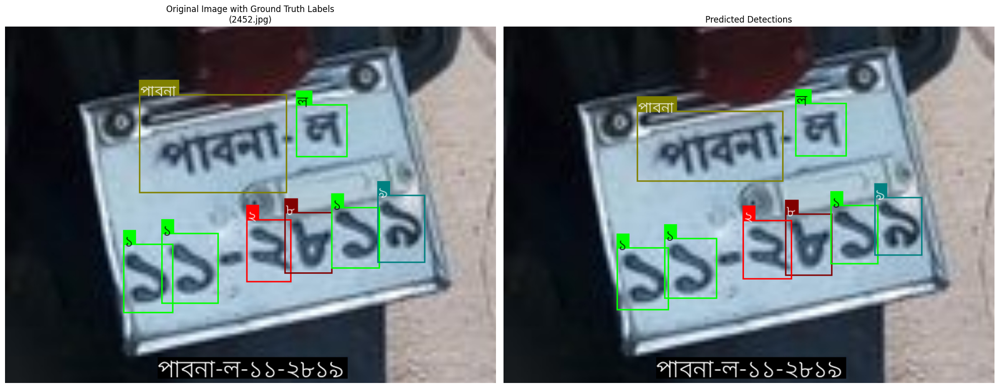


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/1634.jpg: 544x640 2 0s, 2 1s, 1 5, 1 9, 1 L, 1 Khagrachari, 22.2ms
Speed: 2.4ms preprocess, 22.2ms inference, 2.0ms postprocess per image at shape (1, 3, 544, 640)


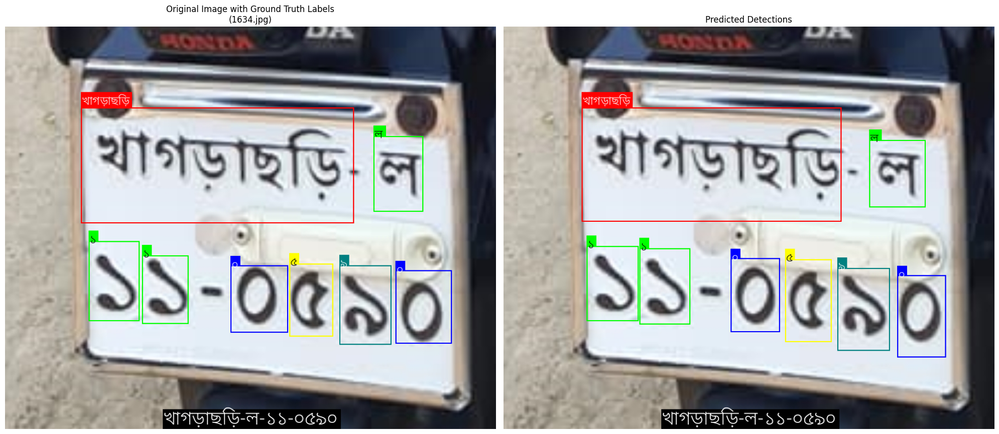


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/1527.jpg: 480x640 1 0, 2 1s, 1 2, 1 6, 1 7, 1 H, 1 Nilphamari, 15.1ms
Speed: 1.4ms preprocess, 15.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


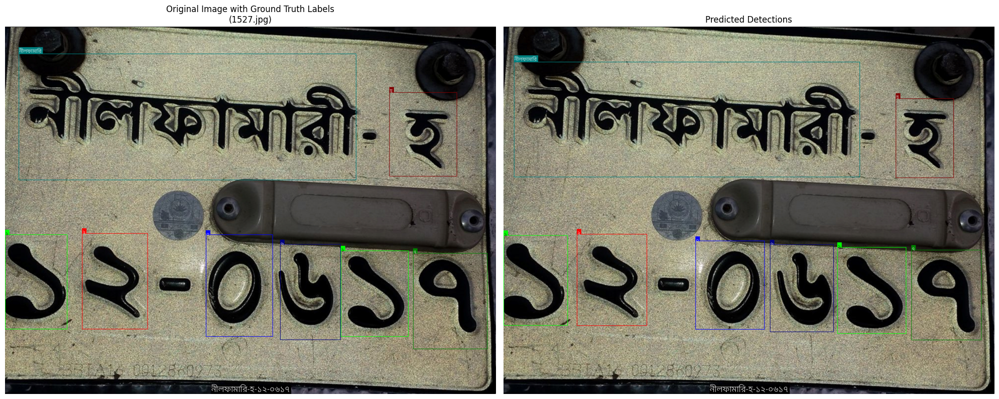


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/2011.jpg: 352x640 2 1s, 1 2, 2 3s, 1 5, 1 H, 1 Sylhet, 15.2ms
Speed: 0.9ms preprocess, 15.2ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 640)


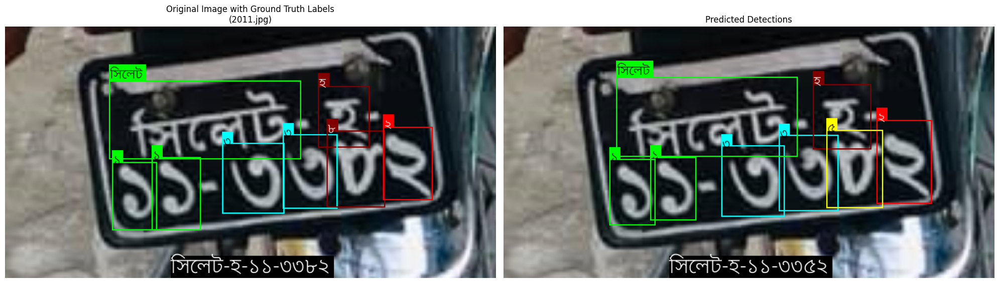


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/496.jpg: 416x640 1 3, 1 4, 1 5, 1 6, 1 7, 1 8, 1 Ch, 1 Cumilla, 15.3ms
Speed: 1.0ms preprocess, 15.3ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)


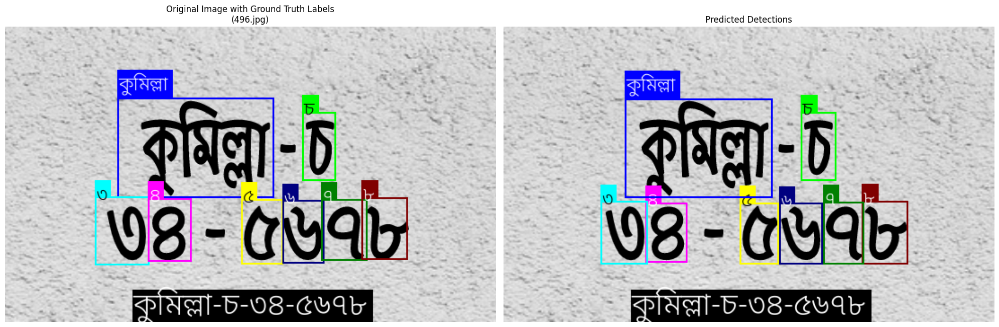


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/119.jpeg: 448x640 1 0, 2 1s, 1 3, 1 4, 1 7, 1 8, 1 Th, 1 Tangail, 15.0ms
Speed: 0.9ms preprocess, 15.0ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)


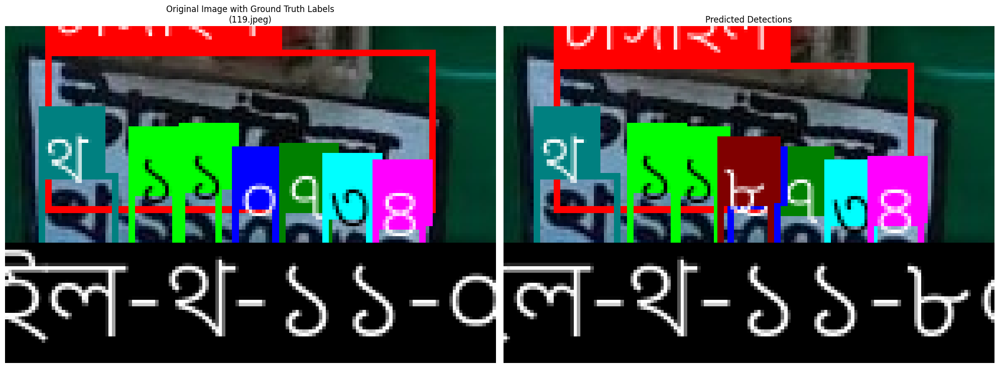


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/879.jpg: 640x544 1 0, 1 1, 3 3s, 1 L, 1 Gopalganj, 17.8ms
Speed: 2.1ms preprocess, 17.8ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 544)


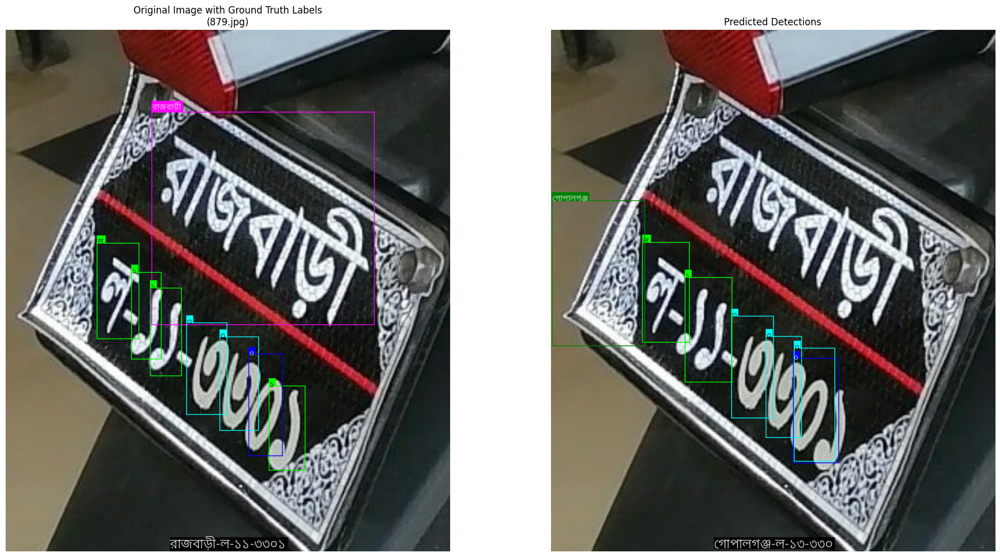


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/2252.jpg: 480x640 1 1, 1 2, 2 3s, 1 4, 1 5, 1 Metro, 1 L, 1 Dhaka, 16.0ms
Speed: 1.1ms preprocess, 16.0ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)


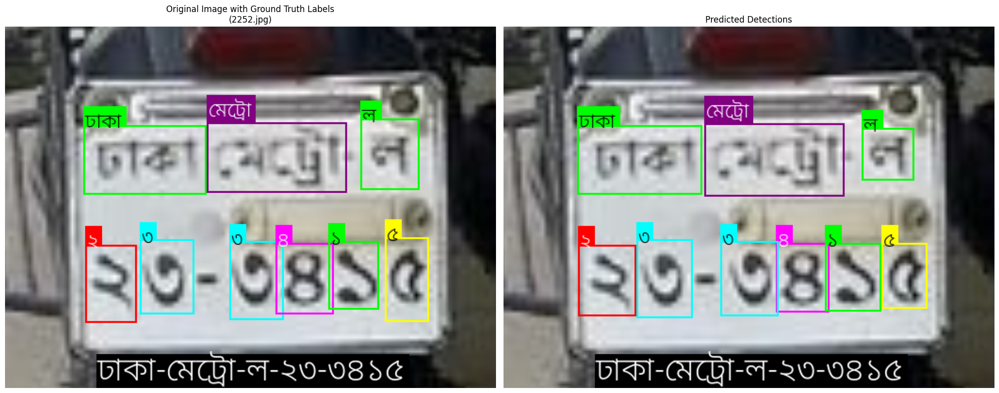


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/431.jpg: 352x640 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 O, 1 Chuadanga, 16.8ms
Speed: 1.0ms preprocess, 16.8ms inference, 1.1ms postprocess per image at shape (1, 3, 352, 640)


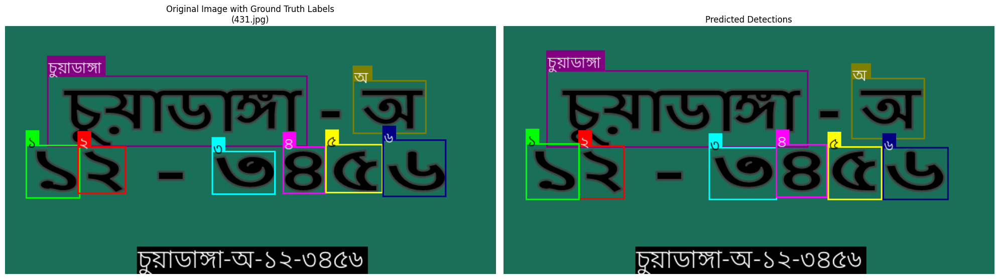


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/2255.jpg: 480x640 3 3s, 1 4, 1 5, 1 9, 1 Metro, 1 H, 1 Dhaka, 22.3ms
Speed: 1.4ms preprocess, 22.3ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


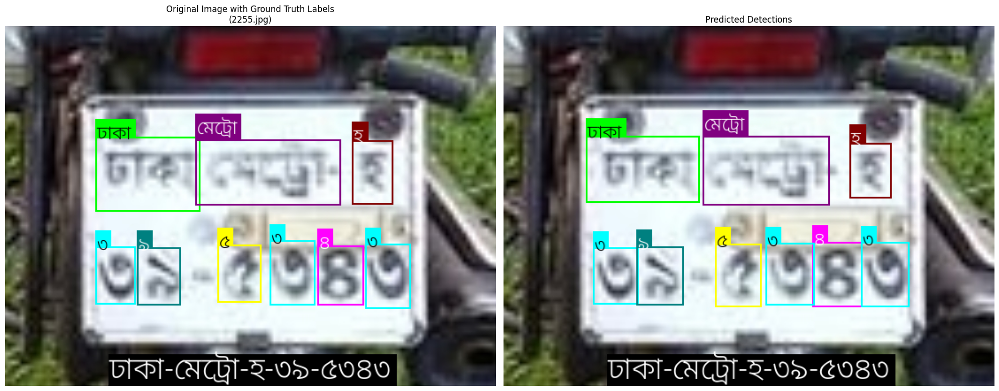


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/2212.jpg: 416x640 1 0, 2 1s, 1 3, 1 5, 1 8, 1 Metro, 1 Gh, 1 Dhaka, 15.4ms
Speed: 1.0ms preprocess, 15.4ms inference, 0.8ms postprocess per image at shape (1, 3, 416, 640)


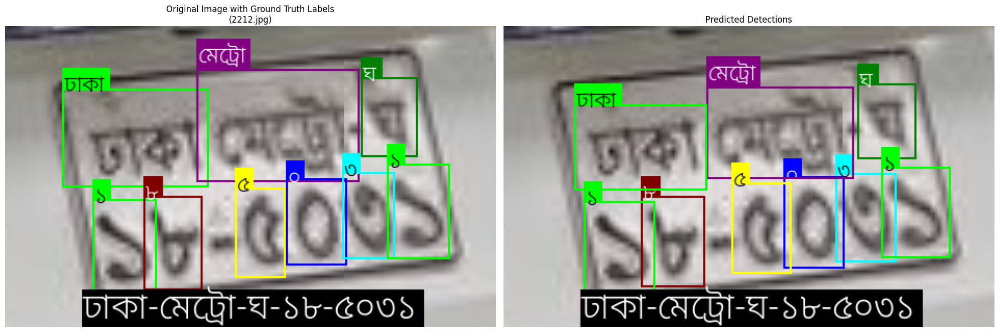


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/2340.jpg: 416x640 4 1s, 1 6, 1 8, 1 Metro, 1 G, 1 Dhaka, 15.4ms
Speed: 1.0ms preprocess, 15.4ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)


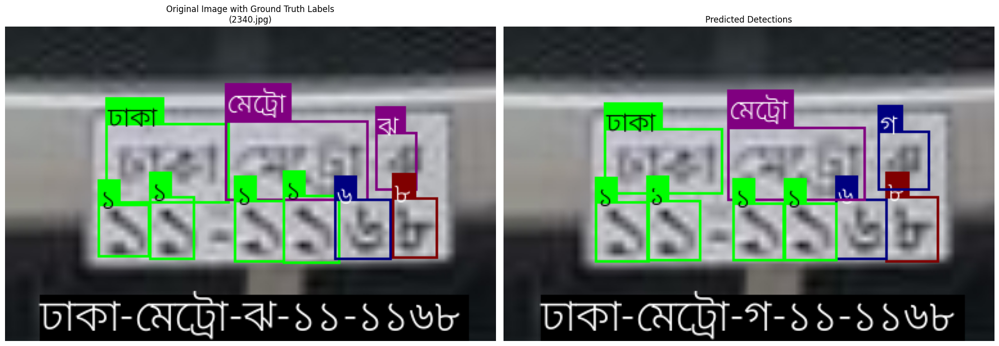


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/2381.jpg: 480x640 1 0, 1 1, 1 4, 1 6, 2 7s, 1 Metro, 1 H, 1 Chatt, 17.1ms
Speed: 2.2ms preprocess, 17.1ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


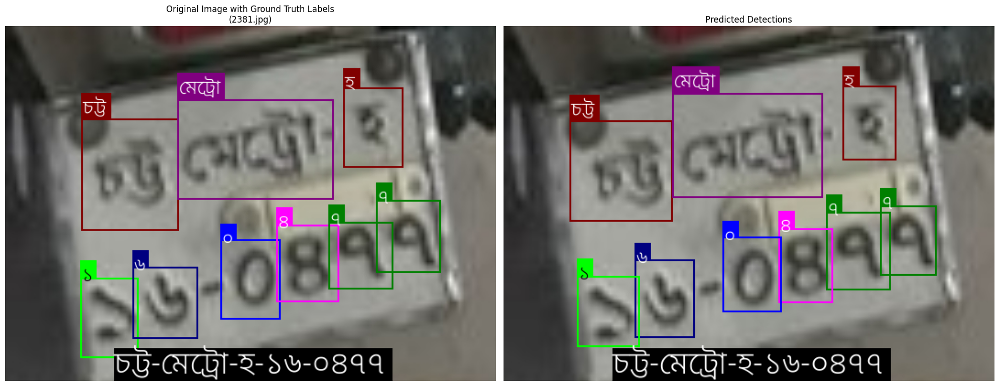


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/1043.jpg: 416x640 1 0, 1 1, 1 3, 1 4, 1 5, 1 6, 1 Jh, 1 M, 1 Sylhet, 17.0ms
Speed: 1.0ms preprocess, 17.0ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)


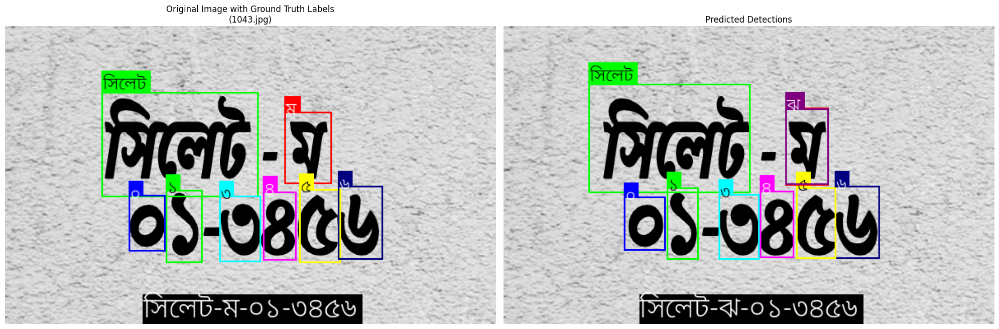


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/1262.jpg: 256x640 1 0, 1 1, 1 2, 1 7, 1 8, 1 9, 1 L, 1 Moulvibazar, 16.7ms
Speed: 0.7ms preprocess, 16.7ms inference, 1.0ms postprocess per image at shape (1, 3, 256, 640)


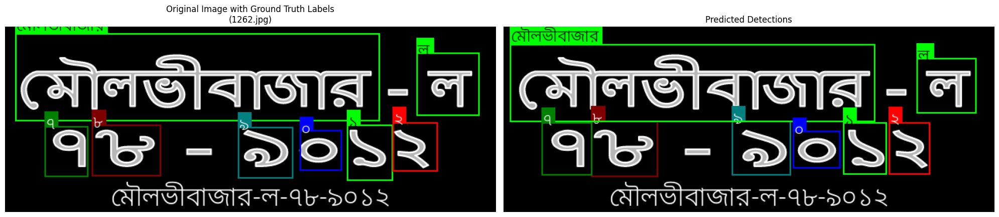


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/2490.jpg: 448x640 2 2s, 2 3s, 1 5, 1 7, 1 Metro, 1 T, 1 Dhaka, 15.9ms
Speed: 1.0ms preprocess, 15.9ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)


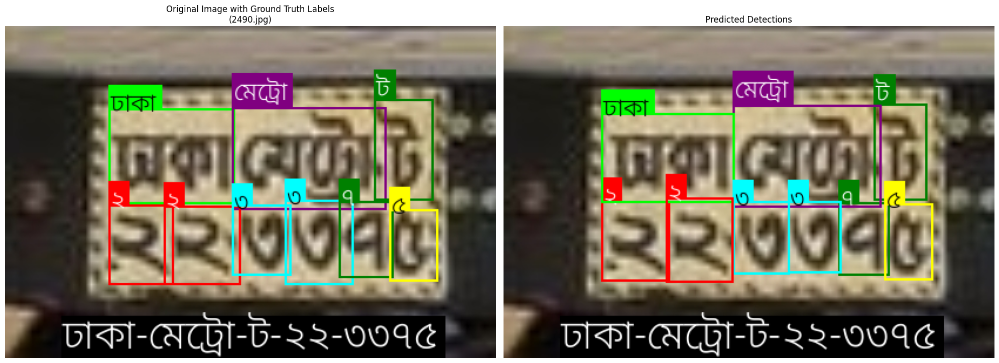


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/884.jpg: 352x640 2 1s, 1 3, 1 5, 1 6, 1 8, 1 L, 1 Rajbari, 17.7ms
Speed: 1.1ms preprocess, 17.7ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)


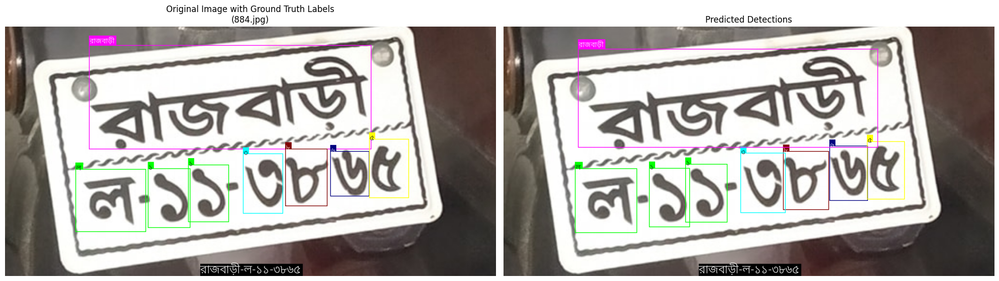


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/2298.jpg: 448x640 4 1s, 1 4, 1 6, 1 L, 1 Jamalpur, 16.4ms
Speed: 1.3ms preprocess, 16.4ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)


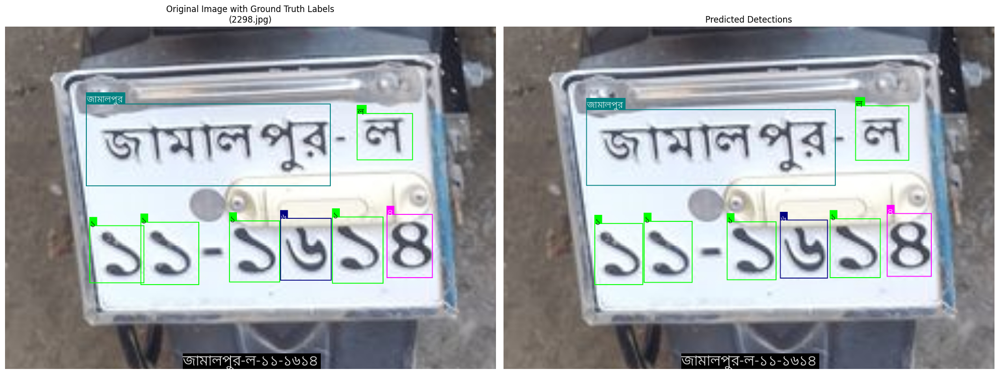


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/374.jpg: 352x640 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 Thh, 1 Bhola, 15.0ms
Speed: 0.9ms preprocess, 15.0ms inference, 0.7ms postprocess per image at shape (1, 3, 352, 640)


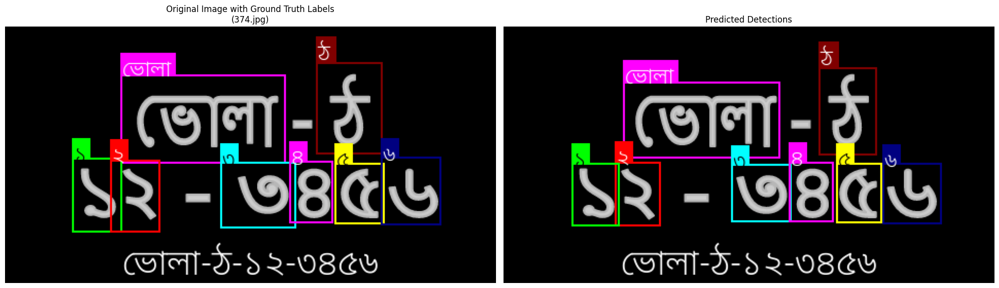


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/406.jpg: 320x640 1 0, 1 5, 1 6, 1 7, 1 8, 1 9, 1 T, 1 Brahmanbaria, 15.6ms
Speed: 0.8ms preprocess, 15.6ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 640)


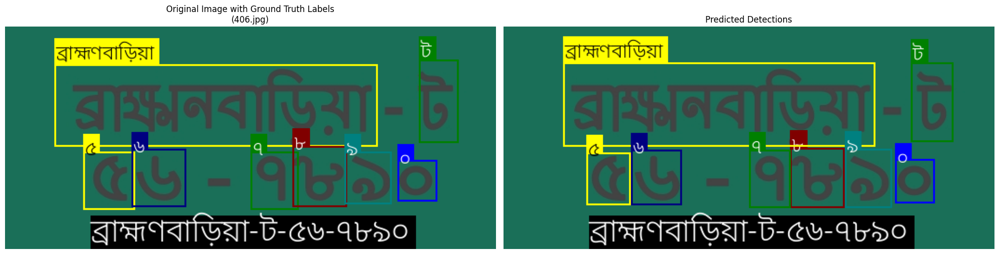


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/113.jpeg: 448x640 1 1, 1 2, 1 4, 2 6s, 1 8, 1 H, 1 Tangail, 16.5ms
Speed: 0.9ms preprocess, 16.5ms inference, 0.7ms postprocess per image at shape (1, 3, 448, 640)


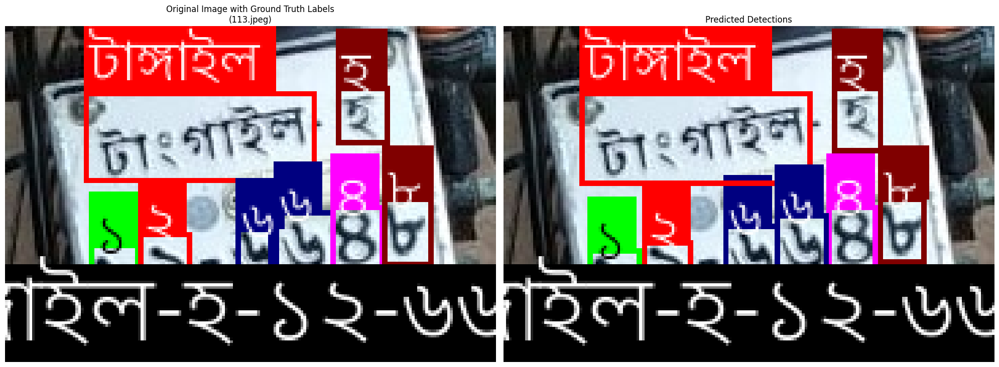


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/2243.jpg: 352x640 2 2s, 2 4s, 1 5, 1 9, 1 Metro, 1 T, 1 Dhaka, 15.6ms
Speed: 0.9ms preprocess, 15.6ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)


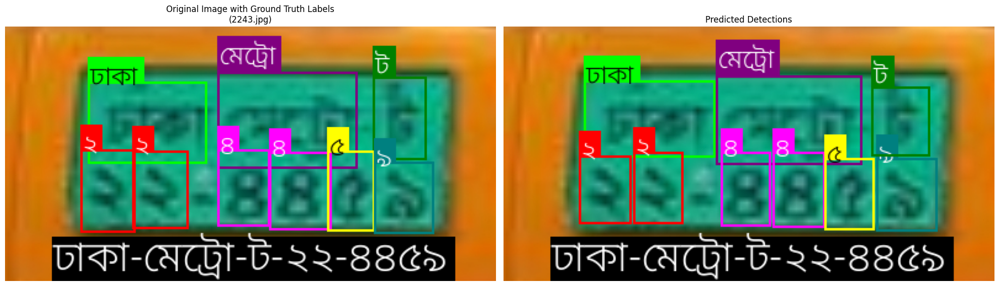


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/486.jpg: 512x640 1 1, 1 2, 1 3, 1 4, 1 5, 1 6, 1 Ch, 1 Cumilla, 15.1ms
Speed: 1.2ms preprocess, 15.1ms inference, 0.7ms postprocess per image at shape (1, 3, 512, 640)


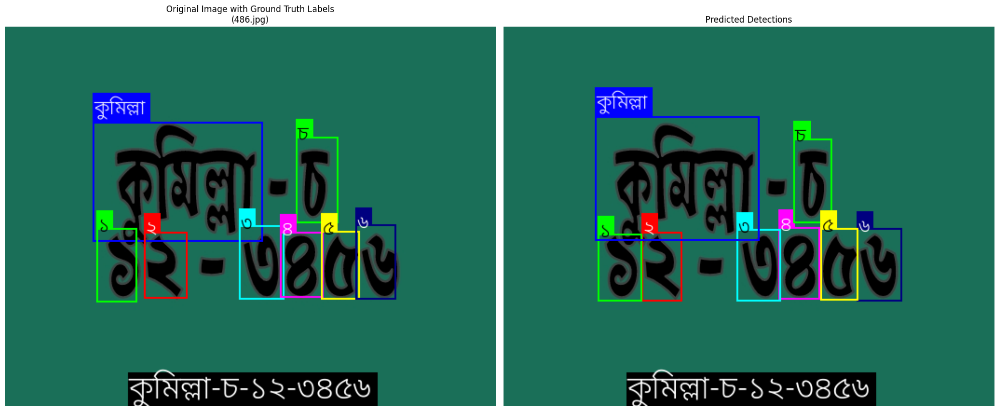


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/1468.jpg: 448x640 1 0, 3 1s, 1 4, 1 8, 1 L, 1 Jhalokati, 17.8ms
Speed: 2.3ms preprocess, 17.8ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)


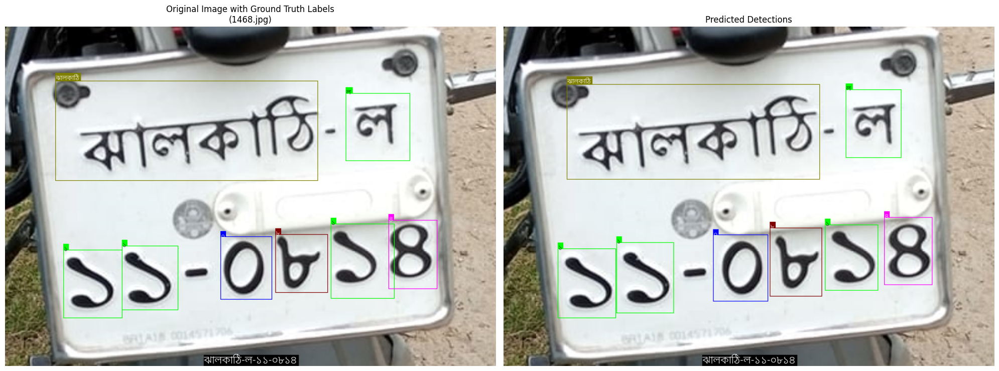


image 1/1 /mnt/Common/Code/Model Training/Nowshin/Bengali License Plate Detection/dataset/test/images/303.jpg: 448x640 1 0, 1 2, 2 5s, 1 7, 1 8, 1 Metro, 1 G, 1 Dhaka, 14.8ms
Speed: 0.9ms preprocess, 14.8ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)


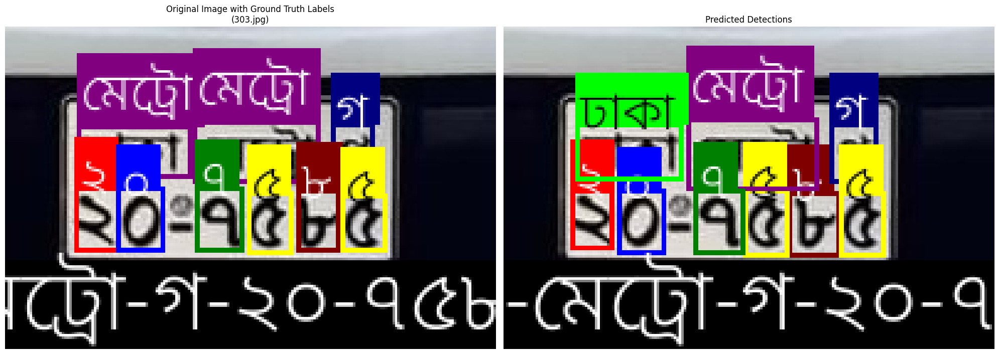

In [77]:
%matplotlib inline
for img_path in test_image_files:
    img_filename = os.path.basename(img_path)
    img_name_no_ext = os.path.splitext(img_filename)[0]
    label_path = os.path.join(TEST_LABELS_DIR, img_name_no_ext + '.txt')

    original_image = cv2.imread(img_path)
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

    ground_truth_annotations = []
    ground_truth_car_number = []
    ground_truth_car_area = ""
    ground_truth_car_metro = ""
    ground_truth_car_letter = ""

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = list(map(float, line.strip().split()))
                ground_truth_annotations.append(parts)

                cls_id, x_center, y_center, width, height = parts[:5]
                cls_id = int(cls_id)

                if cls_id < 10:
                    ground_truth_car_number.append({'x_center': x_center, 'class_id': bangla_anote[str(cls_id)]})
                elif cls_id == 10:
                    ground_truth_car_metro = bangla_anote[str(cls_id)] + '-'
                elif (10 < cls_id < 35) or (99 < cls_id < 102):
                    ground_truth_car_letter = bangla_anote[str(cls_id)] + '-'
                else:
                    ground_truth_car_area = bangla_anote[str(cls_id)] + '-'

        ground_truth_car_number.sort(key=lambda item: item['x_center'])
        ground_truth_car_number = "".join(str(item['class_id']) for item in ground_truth_car_number)
        ground_truth_car_number_plate = ground_truth_car_area + ground_truth_car_metro + ground_truth_car_letter + ground_truth_car_number[:2] + '-' + ground_truth_car_number[2:]
    else:
        ground_truth_car_number_plate = ""
        
    ground_truth_image_display = draw_annotations(original_image.copy(), ground_truth_annotations, class_names, is_gt=True, title_text=ground_truth_car_number_plate)

    prediction_results = trained_model.predict(
        source=img_path,
        imgsz=IMG_SIZE,
        conf=CONF_THRESHOLD,
        iou=IOU_THRESHOLD,
        # save=True,  # No longer saving predicted images
        # save_txt=True, # No longer saving predicted labels to file
        project=PREDICT_PROJECT_NAME,
        name=PREDICT_RUN_NAME,
        exist_ok=True,
        line_width=1,
        show_conf=False,
    )

    # Extract predicted annotations from the results
    predicted_annotations = []
    predicted_car_number = []
    predicted_car_area = ""
    predicted_car_metro = ""
    predicted_car_letter = ""
    if prediction_results and len(prediction_results) > 0:
        # Assuming single image prediction, take the first result
        res = prediction_results[0]
        if res.boxes:
            for *xywh, conf, cls_id in res.boxes.data.tolist():
                # Convert xyxy (from res.boxes.data) to normalized xywh for draw_annotations
                # YOLO output is typically x_min, y_min, x_max, y_max (xyxy)
                # We need x_center, y_center, width, height (normalized)
                img_h, img_w, _ = original_image.shape
                x_min, y_min, x_max, y_max = xywh
                
                # Convert to normalized (0-1) coordinates
                x_center = ((x_min + x_max) / 2) / img_w
                y_center = ((y_min + y_max) / 2) / img_h
                width = (x_max - x_min) / img_w
                height = (y_max - y_min) / img_h
                cls_id = int(cls_id)

                predicted_annotations.append([int(cls_id), x_center, y_center, width, height, conf])
                if int(cls_id) < 10:
                    predicted_car_number.append({'x_center': x_center, 'class_id': bangla_anote[str(cls_id)]})
                elif int(cls_id) == 10:
                    predicted_car_metro = bangla_anote[str(cls_id)]+ '-'
                elif (10 < int(cls_id) < 35) or (99 < int(cls_id) < 102):
                    predicted_car_letter = bangla_anote[str(cls_id)]+ '-'
                else:
                    predicted_car_area = bangla_anote[str(cls_id)] + '-'
                    
    predicted_car_number.sort(key=lambda item: item['x_center'])
    predicted_car_number= "".join(str(item['class_id']) for item in predicted_car_number)
    predicted_car_number_plate = predicted_car_area + predicted_car_metro + predicted_car_letter + predicted_car_number[:2] + '-' + predicted_car_number[2:]
                
    predicted_image_display = draw_annotations(original_image.copy(), predicted_annotations, class_names, is_gt=False, title_text=predicted_car_number_plate) # Red for predictions

    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    axes[0].imshow(ground_truth_image_display)
    axes[0].set_title(f'Original Image with Ground Truth Labels\n({img_filename})')
    axes[0].axis('off')

    axes[1].imshow(predicted_image_display)
    axes[1].set_title(f'Predicted Detections')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()